# Global Power Generation - Prepping and EDA

Electricity, a manmade resource has to be generated in power plants through a variety of methods. These plants use different types of primary fuels to produce electricity, which is then transmitted over long distances to power homes, businesses, and industries. In its simplest form, electricity generation involves creating steam or mechanical energy to drive turbines, which in turn produce electricity. Primary fuels refer to the original energy sources that drive this process, whether they're thermal (like oil, gas, coal, or nuclear energy) or mechanical (like hydroelectric, wind, or wave power).

In this notebook, we will be exploring the dataset to visualize the distribution of powerplants and usage of fuels across different countries, and regions.

## Table of Contents
1. [Data Preparation](#1-data-preparation)
   1. [Cleaning and Combining the Dataframes](#1.1cleaning-and-combining-the-dataframes)
   2. [Columns for Rank and PlantRankCountryFuel](#1.2columns-for-rank-and-plantrankcountryfuel)
   3. [Dataframes for Capacity and Fuel](#1.3dataframes-for-capacity-and-fuel)
   4. [Palette for Primary Fuel](#1.4-palette-for-primary-fuel)
2. [Exploratory Data Analysis](#2-exploratory-data-analysis)
   1. [Power generation capacity per country](#2.1-power-generation-capacity-per-country)
   2. [Power Generation Capacity - Sub-Regions](#2.2-power-generation-capacity-sub-regions)
   3. [Power Generation Capacity - Cummalative Percent](#2.3-power-generation-capacity-cumulative-percent)
   4. [Primary Fuel - Cummalative Percent](#2.4-primary-fuel-cummalative-percent)
3. [World Map](#3-world-map)
   1. [World Map - China](#3.1-world-map---china)
   2. [World Map - USA](#3.2-world-map---usa)
   3. [World Map - India](#3.3-world-map---india)


In [83]:
#  Import Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

import warnings
warnings.filterwarnings('ignore')

#  world maps
import folium

In [84]:
df = pd.read_csv('./archive/global_power_plants.csv')
gps = pd.read_csv('./archive/countryContinent.csv', encoding='ISO-8859-1')

In [85]:
df_re=df.query('primary_fuel in ["Hydro", "Solar", "Wind","Waste", "Biomass", "Wave and Tidal", "Petcoke", "Geothermal","Storage", "Cogeneration"]')
df_re.head()

,country code,country_long,name of powerplant,capacity in MW,latitude,longitude,primary_fuel,secondary fuel,other_fuel2,other_fuel3,start date,owner of plant,generation_gwh_2021,geolocation_source,estimated_generation_gwh_2021
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,33.0,32.322,65.1190,Hydro,NaN,NaN,NaN,NaN,NaN,NaN,GEODB,123.77
1,AFG,Afghanistan,Kandahar DOG,10.0,31.670,65.7950,Solar,NaN,NaN,NaN,NaN,NaN,NaN,Wiki-Solar,18.43
2,AFG,Afghanistan,Kandahar JOL,10.0,31.623,65.7920,Solar,NaN,NaN,NaN,NaN,NaN,NaN,Wiki-Solar,18.64
3,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,66.0,34.556,69.4787,Hydro,NaN,NaN,NaN,NaN,NaN,NaN,GEODB,225.06
4,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,100.0,34.641,69.7170,Hydro,NaN,NaN,NaN,NaN,NaN,NaN,GEODB,406.16



# 1. Data Preparation 
In this step we will focus on filling all missing fields, dropping redundant columns, renaming columns for easier usage and combining the two datasets to a single Dataframe to include sub region. We will be adding new columns for percent, cummalitive percent and rank. We will also be creating new dataframes for capacity, fuel and sub-regions

## 1.1 Cleaning and Combining the Dataframes
* Drop redundant columns
* Rename Columns
* Check for NULLs, Duplicates, and missing values
* Replace missing values
* Check consistency of country names
* combine the dataframes

<function matplotlib.pyplot.show(close=None, block=None)>

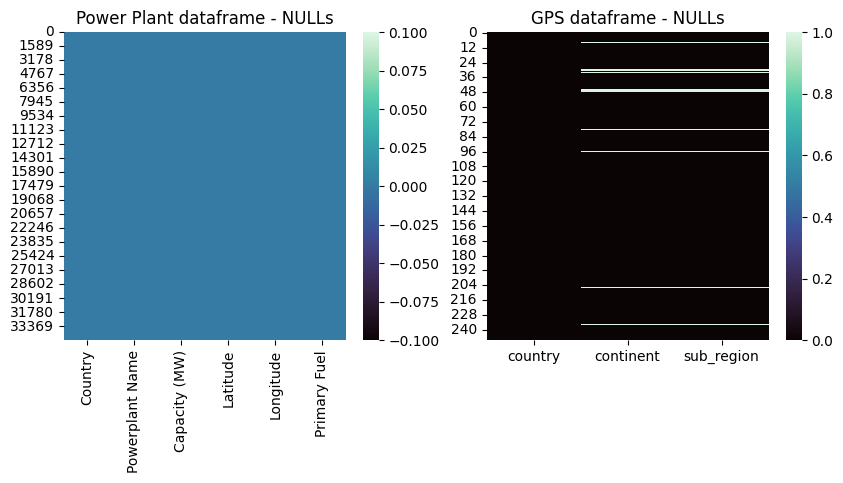

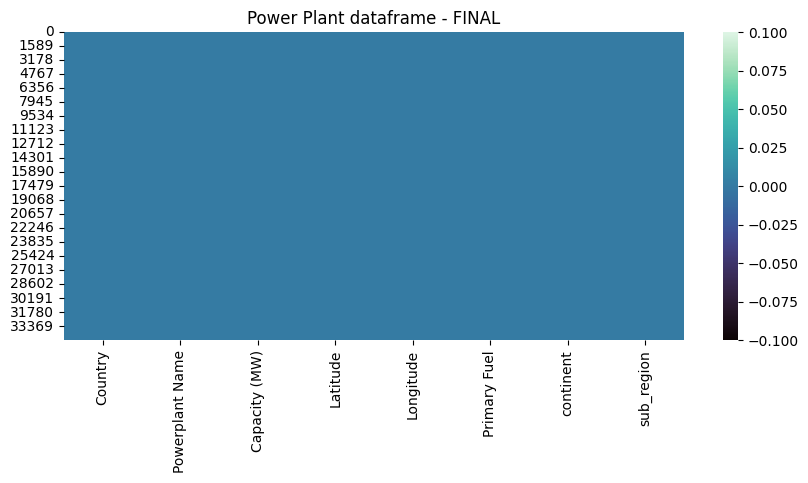

In [86]:
#  Drop un-needed columns in both dataframes
df.drop(['country code', 'secondary fuel', 'other_fuel2', 'other_fuel3', 'start date', 'owner of plant', 'generation_gwh_2021', 'geolocation_source', 'estimated_generation_gwh_2021'], inplace=True, axis=1)
gps.drop(['code_2', 'code_3', 'country_code', 'iso_3166_2', 'region_code', 'sub_region_code'], inplace=True, axis=1)

#  Rename columns in power-plant dataset
df.rename(columns={'country_long': 'Country',
                   'name of powerplant': 'Powerplant Name',
                   'capacity in MW': 'Capacity (MW)',
                   'latitude': 'Latitude',
                   'longitude': 'Longitude',
                   'primary_fuel': 'Primary Fuel'}, inplace=True)

#  Check for NULLs and duplicates with heatmaps
plt.figure(figsize=(10,4))
plt.subplot(121)
sns.heatmap(df.isnull(), cmap = 'mako')
plt.title('Power Plant dataframe - NULLs')

plt.subplot(122)
sns.heatmap(gps.isnull(), cmap = 'mako')
plt.title('GPS dataframe - NULLs')
plt.show

#print('DF  duplicate count:\t', df.duplicated().sum())
#print('GPS duplicate count:\t', gps.duplicated().sum())
#----------------------------------------


#  Check for missing values in GPS dataframe
#----------------------------------------
#a = gps['country'][gps['continent'].isnull()].tolist()
#b = gps['country'][gps['sub_region'].isnull()].tolist()
#missing = list(set(a + b))
#print(missing)
#----------------------------------------


#  Fill out all missing values in GPS dataframe
#----------------------------------------
gps['continent'][gps['country']  == 'Antarctica'] = 'Antarctica'
gps['sub_region'][gps['country'] == 'Antarctica'] = 'Antarctica'

gps['continent'][gps['country']  == 'Bouvet Island'] = 'Antarctica'
gps['sub_region'][gps['country'] == 'Bouvet Island'] = 'Antarctica'

gps['continent'][gps['country']  == 'British Indian Ocean Territory'] = 'Africa'
gps['sub_region'][gps['country'] == 'British Indian Ocean Territory'] = 'Eastern Africa'

gps['continent'][gps['country']  == 'Christmas Island'] = 'Oceania'
gps['sub_region'][gps['country'] == 'Christmas Island'] = 'Australia and New Zealand'

gps['continent'][gps['country']  == 'Cocos (Keeling) Islands'] = 'Oceania'
gps['sub_region'][gps['country'] == 'Cocos (Keeling) Islands'] = 'Australia and New Zealand'

gps['continent'][gps['country']  == 'French Southern Territories'] = 'Antarctica'
gps['sub_region'][gps['country'] == 'French Southern Territories'] = 'Antarctica'

gps['continent'][gps['country']  == 'Heard Island and McDonald Islands'] = 'Antarctica'
gps['sub_region'][gps['country'] == 'Heard Island and McDonald Islands'] = 'Antarctica'

gps['continent'][gps['country']  == 'South Georgia and the South Sandwich Islands'] = 'Americas'
gps['sub_region'][gps['country'] == 'South Georgia and the South Sandwich Islands'] = 'South America'

gps['continent'][gps['country']  == 'United States Minor Outlying Islands'] = 'Americas'
gps['sub_region'][gps['country'] == 'United States Minor Outlying Islands'] = 'Northern America'

#  GPS:  check countries with continent, sub_regions = NULL
#print('missing values filled in GPS:\n', gps.isnull().sum(), sep = '')
#----------------------------------------


#  Verify country names are consistent in DF and GPS
#----------------------------------------
#  1.  Verify country names are consistent in 'df' and 'gps'
m = []
count = 0
for i in sorted(df.Country.unique()):
    if len(gps.country[gps.country == i].values) == 0:
        #print('MISSING:  df: {:<35}gps:{}'.format(i,gps.country[gps.country == i].values))
        #print(gps[gps['country'].str.contains(i, case=False)])
        m.append(i)
        count = count + 1
#print('check complete:  {} missing'.format(count))


#  2. Update Country Names
#  update country names in "df" and "gps" dataframe
#  Albania and Kosovo are the same countries.
df.replace({'Kosovo':'Albania'}, inplace = True)

#  update names in "gps" with names in "df"
gps.replace({'Bolivia (Plurinational State of)':'Bolivia',
             'Cabo Verde':'Cape Verde',
             'Côte d\'Ivoire':'Cote DIvoire',
             'Congo (Democratic Republic of the)':'Democratic Republic of the Congo',
             'Iran (Islamic Republic of)':'Iran',
             'Lao People\'s Democratic Republic':'Laos',
             'Macedonia (the former Yugoslav Republic of)':'Macedonia',
             'Moldova (Republic of)':'Moldova',
             'Korea (Democratic People\'s Republic of)':'North Korea',
             'Palestine, State of':'Palestine',
             'Russian Federation':'Russia',
             'Korea (Republic of)':'South Korea',
             'Taiwan, Province of China':'Taiwan',
             'Tanzania, United Republic of':'Tanzania',
             'United Kingdom of Great Britain and Northern Ireland':'United Kingdom',
             'Venezuela (Bolivarian Republic of)':'Venezuela',
             'Viet Nam':'Vietnam'}, inplace=True)

#print('--- Country names updated in df & gps ---')


#  3.  Verify country names are consistent in 'df' and 'gps'
m = []
count = 0
for i in sorted(df.Country.unique()):
    if len(gps.country[gps.country == i].values) == 0:
        #print('MISSING:  df: {:<35}gps:{}'.format(i,gps.country[gps.country == i].values))
        #print(gps[gps['country'].str.contains(i, case=False)])
        m.append(i)
        count = count + 1
#print('check complete:  {} missing'.format(count))
#----------------------------------------


#  Combine the dataframes
#----------------------------------------
#  Combine the datasets keyed on country names
df = df.join(gps.set_index('country'), on='Country')

#  heatmaps - FINAL
plt.figure(figsize=(10,4))
sns.heatmap(df.isnull(), cmap = 'mako')
plt.title('Power Plant dataframe - FINAL')
plt.show
#----------------------------------------

In [87]:
print(' - Power Plant dataset has {} countries on {} continents with {} sub-regions.'.format(len(df.Country.unique()), len(df.continent.unique()), len(df.sub_region.unique())))
print(' - Globally, there are {:,} power-plants using {} different types of primary fuels to generate {:,.0f} GW of electricity'.format(len(df['Powerplant Name'].unique()), len(df['Primary Fuel'].unique()), df['Capacity (MW)'].sum()/1000))

 - Power Plant dataset has 166 countries on 6 continents with 21 sub-regions.
 - Globally, there are 34,528 power-plants using 15 different types of primary fuels to generate 5,707 GW of electricity


## 1.2 Columns for Rank and PlantRankCountryFuel
* Adding Global Rank column based on Power Plant Capacity
* Adding PlantRankCountryFuel for labels in plots, using the Powerplant Name, Global Rank, Country and Primary Fuel columns

In [88]:
#  DATAFRAME - ADD COLUMNS
#  - global ranking
#  - Power Plant name + Country + Global Rank
#----------------------------------------
#  Global Rank
df['Global Rank'] = df['Capacity (MW)'].rank(ascending=False, axis = 0).astype('int')

#  - Power Plant name + Country + Global Rank
df['PlantRankCountryFuel'] = df['Powerplant Name'] + '\n#' \
                    + df['Global Rank'].astype(str) + ': ' \
                    + df['Country'] + ' -'  \
                    + df['Primary Fuel'].str.upper()


df.sample(5)
#----------------------------------------

,Country,Powerplant Name,Capacity (MW),Latitude,Longitude,Primary Fuel,continent,sub_region,Global Rank,PlantRankCountryFuel
32610,United States of America,Site 980 65,2.1,37.0568,-119.8997,Hydro,Americas,Northern America,30259,Site 980 65\n#30259: United States of America ...
33501,United States of America,Tsar Nicholas LLC,1.9,44.4200,-96.4347,Wind,Americas,Northern America,31315,Tsar Nicholas LLC\n#31315: United States of Am...
24960,United States of America,Almond Power Plant,223.5,37.5744,-120.9850,Gas,Americas,Northern America,5045,Almond Power Plant\n#5045: United States of Am...
7737,China,PowerChina Huating power station,290.0,35.1953,106.5689,Coal,Asia,Eastern Asia,4418,PowerChina Huating power station\n#4418: China...
7492,China,Lushan A,15.0,33.6640,112.9130,Solar,Asia,Eastern Asia,18070,Lushan A\n#18070: China -SOLAR


### 1.3 Dataframes for Capacity and Fuel
Create two new dataframes :
1. df_capacity - sorted list of capacity grouped by Country for Capacity per Country plots
2. df_fuel - sorted list of capacity grouped by Primary Fuel for Capacity per Primary Fuel plots

In [89]:
#  total global power plant capacity
#----------------------------------------
global_capacity = df['Capacity (MW)'].sum()


#  CAPACITY power generation capacity, df_capacity
#----------------------------------------
df_capacity = df['Capacity (MW)'].groupby(df['Country']).sum().sort_values(ascending = False).reset_index()
df_capacity['Capacity (GW)'] = df_capacity['Capacity (MW)']/1000

#  percent and cummalative percent
df_capacity['percent'] = df_capacity['Capacity (MW)'] * 100 /global_capacity
df_capacity['cummalative percent'] = df_capacity['percent'].cumsum()

#  power plant count per country
df_countryPlantCount = df['Powerplant Name'].groupby(df['Country']).count().reset_index()
df_countryPlantCount.rename(columns = {'Powerplant Name':'numOfPowerPlants'}, inplace = True)
df_capacity = df_capacity.join(df_countryPlantCount.set_index('Country'), on = 'Country')

#  sub_regions for each country
sub_reg = df.drop_duplicates('Country').set_index('Country')['sub_region'].reset_index()
df_capacity = df_capacity.join(sub_reg.set_index('Country'), on = 'Country')


#  PRIMARY FUEL power generation capacity, df_fuel
#----------------------------------------
df_fuel = df['Capacity (MW)'].groupby(df['Primary Fuel']).sum().sort_values(ascending = False).reset_index()
df_fuel['Capacity (GW)'] = df_fuel['Capacity (MW)']/1000

#  percent and cummalative percent
df_fuel['percent'] = df_fuel['Capacity (MW)'] * 100 /global_capacity
df_fuel['cummalative percent'] = df_fuel['percent'].cumsum()

#  power plant count per primary fuel
df_fuelPlantCount = df['Powerplant Name'].groupby(df['Primary Fuel']).count().reset_index()
df_fuelPlantCount.rename(columns = {'Powerplant Name':'numOfPowerPlants'}, inplace = True)
df_fuel = df_fuel.join(df_fuelPlantCount.set_index('Primary Fuel'), on = 'Primary Fuel')


#  SUB-REGION power generation capacity, df_sub_region
#----------------------------------------
df_sub_region = df_capacity.groupby(by = 'sub_region').sum().reset_index()


#  print out columns
#----------------------------------------
print('df_capacity:\n', *df_capacity, sep='  ')
print('df_fuel:\n', *df_fuel, sep='  ')
print('df_sub_region:\n', *df_sub_region, sep='  ')

df_capacity:
  Country  Capacity (MW)  Capacity (GW)  percent  cummalative percent  numOfPowerPlants  sub_region
df_fuel:
  Primary Fuel  Capacity (MW)  Capacity (GW)  percent  cummalative percent  numOfPowerPlants
df_sub_region:
  sub_region  Country  Capacity (MW)  Capacity (GW)  percent  cummalative percent  numOfPowerPlants


### 1.4 Palette for Primary Fuel
Creating a color palette for a consistent display of Primary fuels in visualization

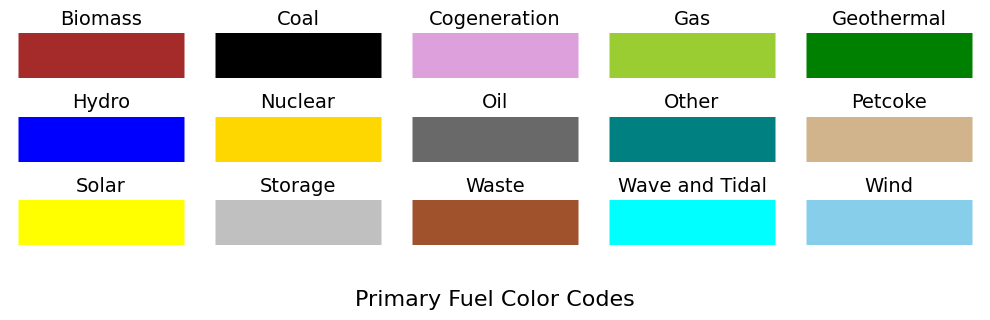

In [90]:
fuel = {'Biomass': 'brown',
        'Coal': 'black',
        'Cogeneration': 'plum',
        'Gas': 'yellowgreen',
        'Geothermal': 'green',
        'Hydro': 'blue',
        'Nuclear': 'gold',
        'Oil': 'dimgray',
        'Other': 'teal',
        'Petcoke': 'tan',
        'Solar': 'yellow',
        'Storage': 'silver',
        'Waste': 'sienna',
        'Wave and Tidal': 'aqua',
        'Wind': 'skyblue'}

#  plot the colors
plt.figure(figsize=(10,3))
plt.suptitle('Primary Fuel Color Codes', y = -0.1, fontsize = 16)
a, b, c = 3, 5, 1   # rows, columns, counter
    
for x in fuel:
    plt.subplot(a, b, c)  # row, column, counter
    plt.axis('off')
    plt.title(x, fontsize = 14)
    plt.hlines(0,0,10, color = fuel[x] ,linestyles = 'solid', linewidth = 35)
    c = c + 1

plt.tight_layout()
plt.show()

## 2. Exploratory Data Analysis 
Now that the dataset is clean, we can look forward to the EDA. We will be looking at the Power Plant electicity generation capacities for all the countries in the datatset, with emphasis on the following metrics:

1. capacity in Mega-Watts
2. global percentage of the capacity produced
3. grouped by countries and primary fuels

### 2.1 Power Generation Capacity per Country

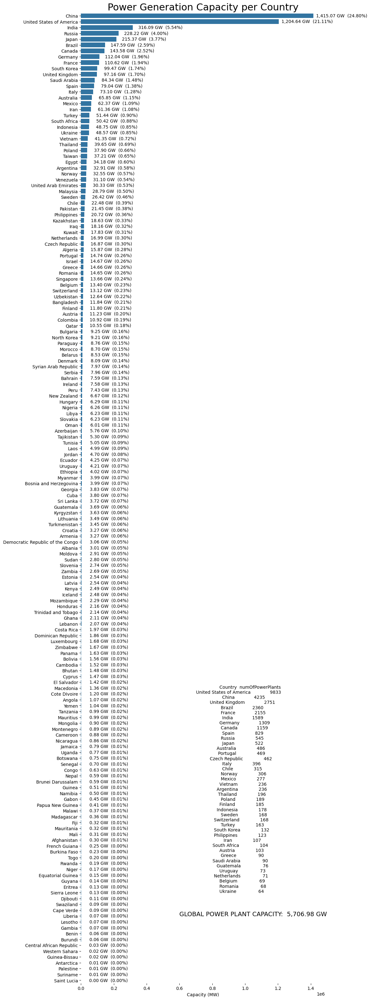

In [91]:
plt.figure(figsize=(10,40))
ax = sns.barplot(data = df_capacity, x = 'Capacity (MW)', y='Country')
plt.title('Power Generation Capacity per Country', fontsize = 22)
plt.box(False)
plt.ylabel("")

for p in ax.patches:
    x = p.get_width()
    cap_per = "{:>10,.2f} GW  ({:,.2f}%)".format(x/1000, x*100/global_capacity)
    ax.annotate("{}".format(cap_per), (p.get_x() + p.get_width(), p.get_y() + .4), ha='left', va='center')

numPP = df_capacity[['Country', 'numOfPowerPlants']].sort_values(by = 'numOfPowerPlants', ascending = False)
plt.text(700000,150,'{}'.format(numPP.head(40).to_string(index = False)))
plt.text(600000,154,'GLOBAL POWER PLANT CAPACITY:  {:,.2f} GW'.format(global_capacity/1000), fontsize = 14)

plt.show()

_Inference_
1. China and USA account for almost 50% of the global power generation
2. India is the only developing country among the top 5

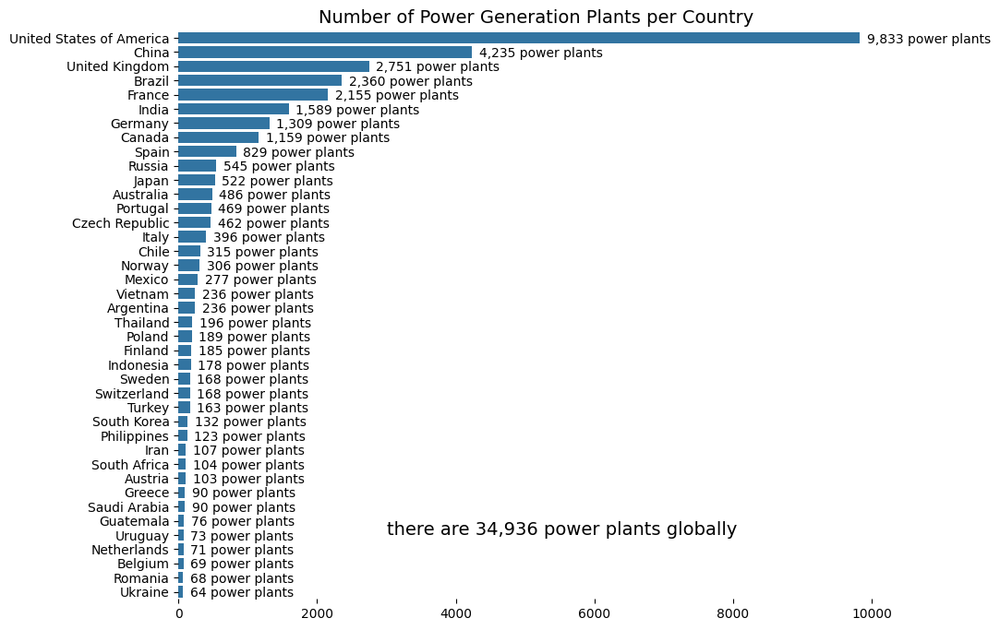

In [92]:
plt.figure(figsize=(10,8))
ax = sns.barplot(data = numPP.head(40), y = 'Country', x = 'numOfPowerPlants')
plt.title('Number of Power Generation Plants per Country', fontsize = 14)
plt.xlabel("")
plt.ylabel("")
plt.box(False)

for p in ax.patches:
    ax.annotate("{:,.0f} power plants".format(p.get_width()), (p.get_x() + p.get_width() + 100, p.get_y() + .5), ha='left', va='center')

plt.text(3000,35,'there are {:,.0f} power plants globally'.format(df_capacity['numOfPowerPlants'].sum()), fontsize = 14)

plt.show()

_Inference_
1. USA has three times the number of powerplants compared to China in the second place
2. India produces more energy compared to Brazil, France and the UK despite having less number of powerplants


### 2.2 Power Generation Capacity - Sub-Regions

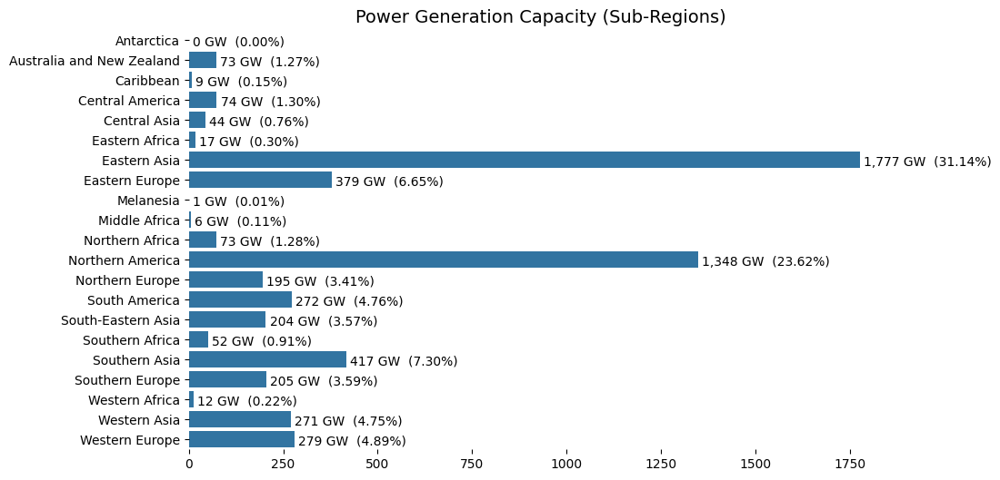

In [93]:
# CAPCITY - sub_region
plt.figure(figsize=(10,6))
ax = sns.barplot(data = df_sub_region, y = 'sub_region', x = 'Capacity (GW)')
plt.title('Power Generation Capacity (Sub-Regions)', fontsize = 14)
plt.xlabel("")
plt.ylabel("")
plt.box(False)

for p in ax.patches:
    x = p.get_width()
    cap_per = "{:,.0f} GW  ({:,.2f}%)".format(x, x * 100/df_sub_region['Capacity (GW)'].sum())
    ax.annotate("{}".format(cap_per), (p.get_x() + p.get_width() + 10, p.get_y() + .5), ha='left', va='center')
   
plt.show()

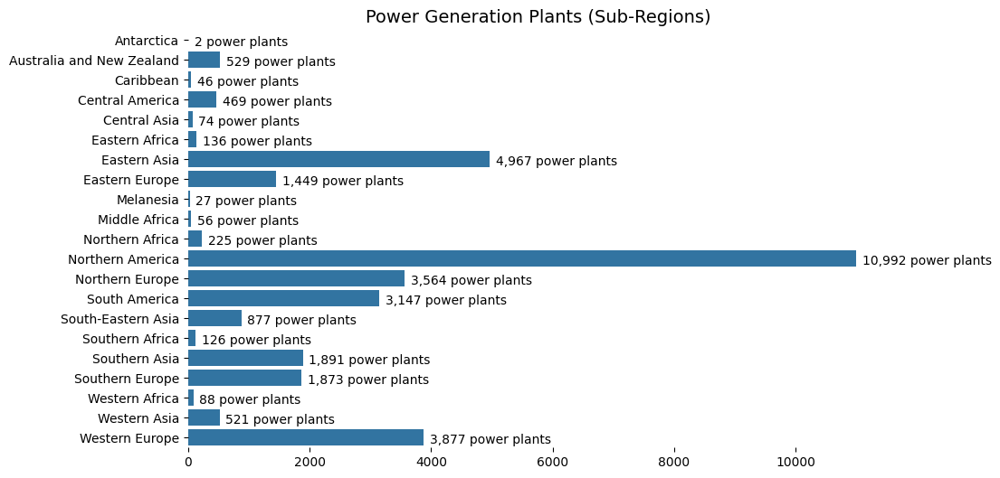

In [94]:
#  Power Plants - sub_region
plt.figure(figsize=(10,6))
ax = sns.barplot(data = df_sub_region, y = 'sub_region', x = 'numOfPowerPlants')
plt.title('Power Generation Plants (Sub-Regions)', fontsize = 14)
plt.xlabel("")
plt.ylabel("")
plt.box(False)

for p in ax.patches:
    ax.annotate("{:,.0f} power plants".format(p.get_width()), (p.get_x() + p.get_width() + 100, p.get_y() + .5), ha='left', va='center')
   
plt.show()

_Inference_
From the above two visuals, we can see a pattern similar to the previous inference. Despite having less number of Power plants, Eastern Asia produces more power compared to North America 

### 2.3 Power Generation Capacity - Cummalative Percent

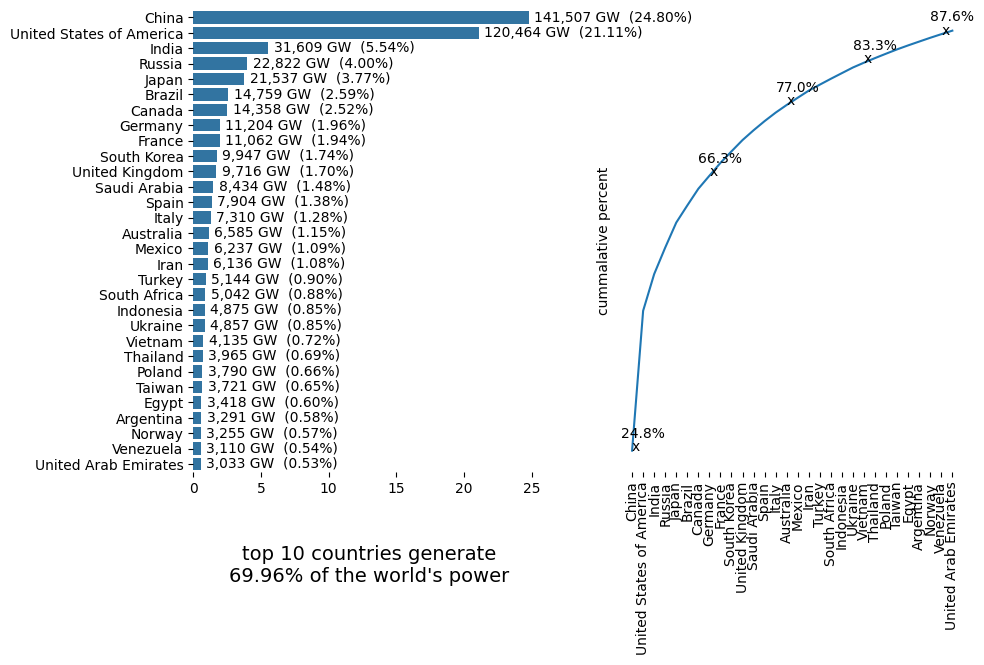

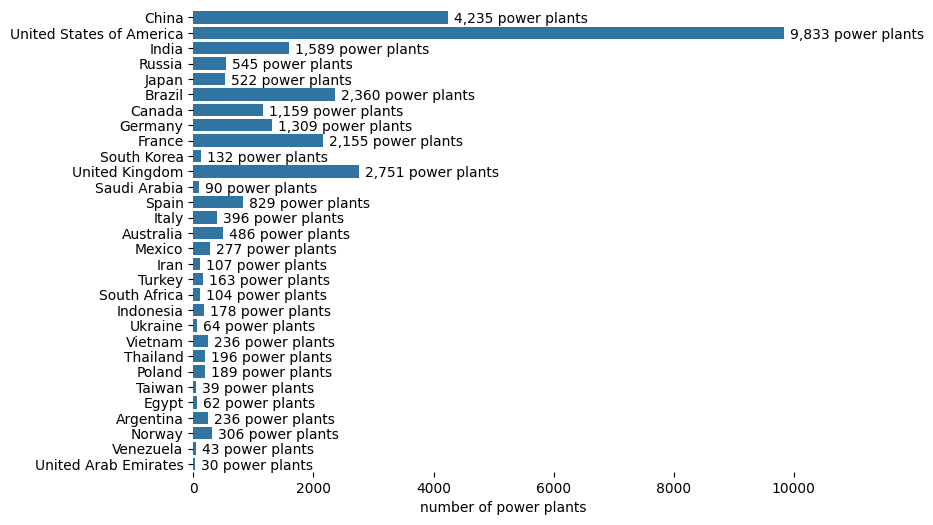

In [95]:
# plot top 30 countries
df_tmp = df_capacity.head(30)


plt.figure(figsize=(10,6))
#  plot Power Generation Capacity of top 30 countries
plt.subplot(121)
ax = sns.barplot(data = df_tmp, x = 'percent', y='Country')
plt.xlabel('\n\ntop 10 countries generate\n{:.2f}% of the world\'s power'.format(df_capacity['percent'].head(10).sum()), fontsize = 14)
plt.ylabel("")
plt.box(False)

for p in ax.patches:
    x = p.get_width()
    cap_per = "{:0,.0f} GW  ({:,.2f}%)".format(x * global_capacity/1000, x)
    ax.annotate("{}".format(cap_per), (p.get_x() + p.get_width() + .4, p.get_y() + .4), ha='left', va='center')


#  plot cummalative Power Generation Capacity percent of top 30 countries
plt.subplot(122)
sns.lineplot(data = df_tmp, x = 'Country', y = 'cummalative percent')
plt.xticks(rotation = 90)
plt.xlabel("")
plt.yticks([])
plt.box(False)

for x, country in enumerate(df_tmp['Country']):
    if x % 7 == 0:
        y = df_capacity['cummalative percent'].loc[x]
        plt.text(x - 1, y + 2, '{:,.1f}%'.format(y))
        plt.text(x, y, 'x', color = 'k')

plt.show()


# CAPACITY - number of power plants
plt.figure(figsize=(8,6))
ax = sns.barplot(data = df_tmp, x = 'numOfPowerPlants', y='Country')
plt.xlabel('number of power plants')
plt.ylabel("")
plt.box(False)

for p in ax.patches:
    ax.annotate("{:,.0f} power plants".format(p.get_width()), (p.get_x() + p.get_width() + 100, p.get_y() + .5), ha='left', va='center')
plt.show()

### 2.4 Primary Fuel - Cummalative Percent

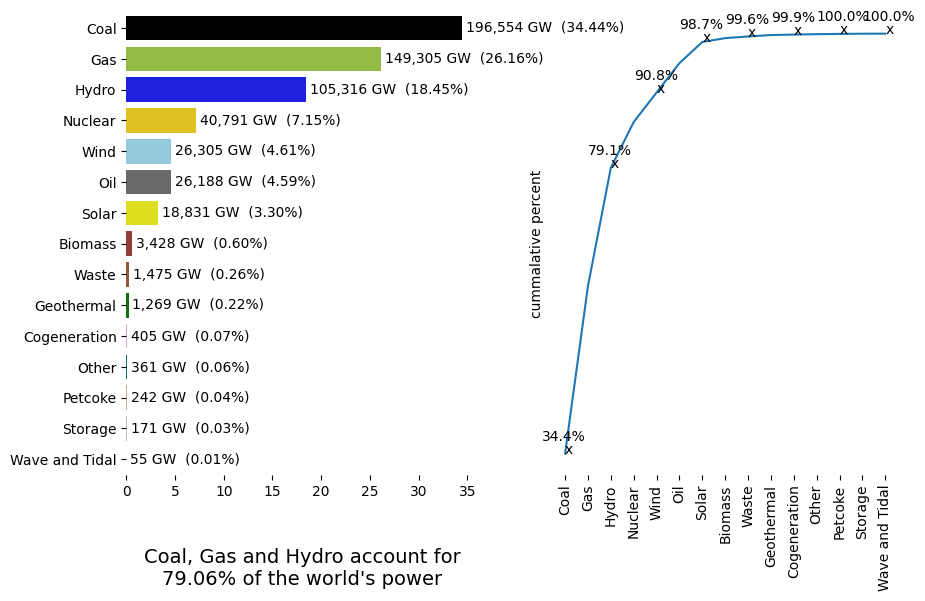

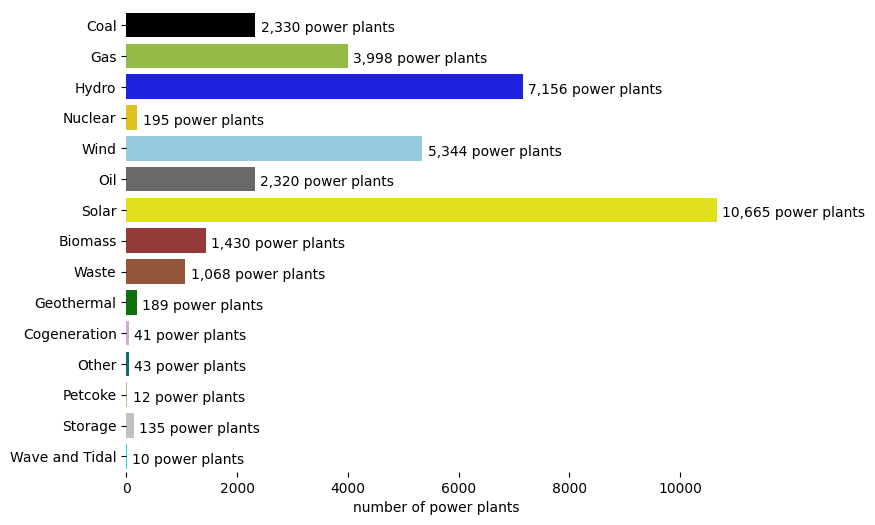

In [96]:
plt.figure(figsize=(10,6))
#  plot Primary Fuel usage percent
plt.subplot(121)
ax = sns.barplot(data = df_fuel, x = 'percent', y = 'Primary Fuel', palette = fuel)
plt.xlabel('\n\nCoal, Gas and Hydro account for\n{:.2f}% of the world\'s power'.format(df_fuel['percent'].head(3).sum()), fontsize = 14)
plt.ylabel("")
plt.box(False)

for p in ax.patches:
    x = p.get_width()
    cap_per = "{:0,.0f} GW  ({:,.2f}%)".format(x * global_capacity/1000, x)
    ax.annotate("{}".format(cap_per), (p.get_x() + p.get_width() + .4, p.get_y() + .4), ha='left', va='center')


#  plot cummalative Primary Fuel usage percent
plt.subplot(122)
sns.lineplot(data = df_fuel, x = 'Primary Fuel', y = 'cummalative percent')
plt.xticks(rotation = 90)
plt.xlabel("")
plt.yticks([])
plt.box(False)

for x, country in enumerate(df_fuel['Primary Fuel']):
    if x % 2 == 0:
        y = df_fuel['cummalative percent'].loc[x]
        plt.text(x - 1, y + 2, '{:,.1f}%'.format(y))
        plt.text(x, y, 'x', color = 'k')
    
plt.show()



# PRIMARY FUEL - number of power plants
plt.figure(figsize=(8,6))
ax = sns.barplot(data = df_fuel, x = 'numOfPowerPlants', y='Primary Fuel', palette = fuel)
plt.xlabel('number of power plants')
plt.ylabel("")
plt.box(False)

for p in ax.patches:
    ax.annotate("{:,.0f} power plants".format(p.get_width()), (p.get_x() + p.get_width() + 100, p.get_y() + .5), ha='left', va='center')
plt.show()

## 3 World Map
Zoom into the maps and click on the dots to see details of the power plants. The color of the dots define the power plant primary fuel. Refer to the pallete for legends

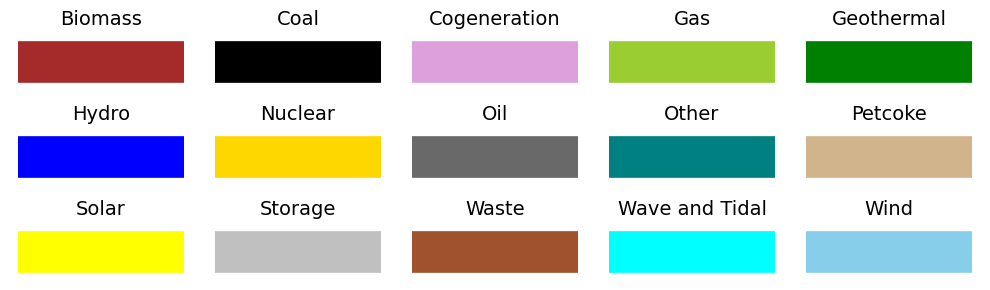

In [97]:
#  plot the colors
plt.figure(figsize=(10,3))
a, b, c = 3, 5, 1   # rows, columns, counter
    
for x in fuel:
    plt.subplot(a, b, c)  # row, column, counter
    plt.axis('off')
    txt = '{}:  {}'.format(x, fuel[x])
    plt.title(x, fontsize = 14)
    plt.hlines(0,0,10, color = fuel[x] ,linestyles = 'solid', linewidth = 30)
    c = c + 1

plt.tight_layout()
plt.show()

### 3.1 Map: Power Plants - China

In [98]:
#  FOLIUM - CHINA
df_map = df[df['Country'] == 'China']
df_map.sort_values(by = 'Capacity (MW)', ascending = False, inplace = True)

#  center map on mean of Latitude/Longitude
map_power = folium.Map(location = [df_map.Latitude.mean(), df_map.Longitude.mean()], tiles = 'cartodbpositron', zoom_start = 4)

#  add Locations to map
for idx, row in df_map.sort_values(by = 'Capacity (MW)', ascending = False).head(2000).iterrows():
    folium.CircleMarker(
        location = [row['Latitude'], row['Longitude']],
        popup = row['PlantRankCountryFuel'],
        radius = 5,
        fill = True, fill_opacity = 1,
        color = fuel.get(row['Primary Fuel'])
        ).add_to(map_power)

#  display interactive map
map_power

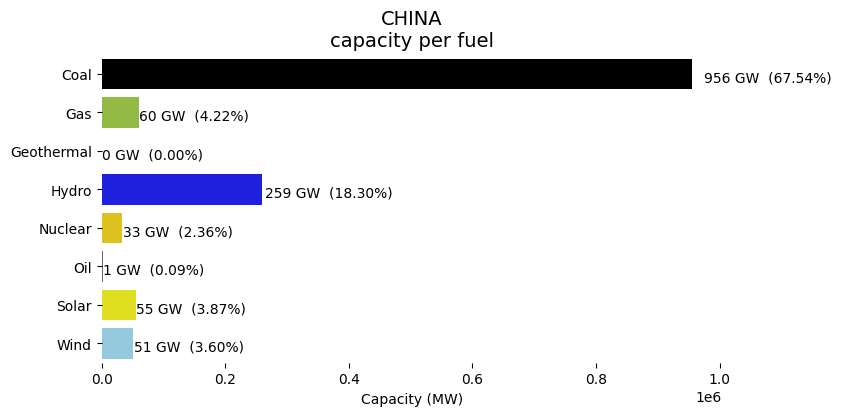

In [99]:
i = 'China'
PF = df[df['Country'] == i].groupby('Primary Fuel').sum().reset_index()  # FUEL
PF['percent'] = PF['Capacity (MW)']/PF['Capacity (MW)'].sum()

plt.figure(figsize=(8,4))
ax = sns.barplot(data = PF, x = 'Capacity (MW)', y = 'Primary Fuel', palette = fuel)
plt.title('{}\ncapacity per fuel'.format(i.upper()), fontsize = 14)
plt.ylabel("")
plt.legend([], frameon = False)
plt.box(False)

for p in ax.patches:
    x = p.get_width()
    cap_per = "{:,.0f} GW  ({:,.2f}%)".format(x/1000, x * 100/PF['Capacity (MW)'].sum())
    ax.annotate("{}".format(cap_per), (p.get_x() + p.get_width() * 1.02, p.get_y() + .5), ha='left', va='center')

plt.show()

### 3.2 Map: Power Plants - USA

In [100]:
#  FOLIUM - USA
df_map = df[df['Country'] == 'United States of America']
df_map.sort_values(by = 'Capacity (MW)', ascending = False, inplace = True)


#  center map on mean of Latitude/Longitude
map_power = folium.Map(location = [df_map.Latitude.mean(), df_map.Longitude.mean()], tiles = 'cartodbpositron', zoom_start = 4)

#  add Locations to map
for idx, row in df_map.sort_values(by = 'Capacity (MW)', ascending = False).head(2000).iterrows():
    folium.CircleMarker(
        location = [row['Latitude'], row['Longitude']],
        popup = row['PlantRankCountryFuel'],
        radius = 5,
        fill = True, fill_opacity = 1,
        color = fuel.get(row['Primary Fuel'])
        ).add_to(map_power)

#  display interactive map
map_power

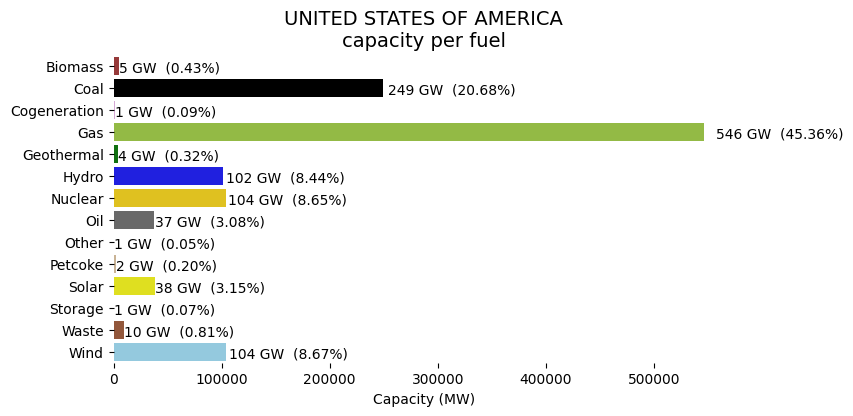

In [101]:
i = 'United States of America'
PF = df[df['Country'] == i].groupby('Primary Fuel').sum().reset_index()  # FUEL
PF['percent'] = PF['Capacity (MW)']/PF['Capacity (MW)'].sum()

plt.figure(figsize=(8,4))
ax = sns.barplot(data = PF, x = 'Capacity (MW)', y = 'Primary Fuel', palette = fuel)
plt.title('{}\ncapacity per fuel'.format(i.upper()), fontsize = 14)
plt.ylabel("")
plt.legend([], frameon = False)
plt.box(False)

for p in ax.patches:
    x = p.get_width()
    cap_per = "{:,.0f} GW  ({:,.2f}%)".format(x/1000, x * 100/PF['Capacity (MW)'].sum())
    ax.annotate("{}".format(cap_per), (p.get_x() + p.get_width() * 1.02, p.get_y() + .5), ha='left', va='center')

plt.show()

### 3.2 Map: Power Plants - India

In [102]:
#  FOLIUM - India
df_map = df[df['Country'] == 'India']
df_map.sort_values(by = 'Capacity (MW)', ascending = False, inplace = True)


#  center map on mean of Latitude/Longitude
map_power = folium.Map(location = [df_map.Latitude.mean(), df_map.Longitude.mean()], tiles = 'cartodbpositron', zoom_start = 4)

#  add Locations to map
for idx, row in df_map.sort_values(by = 'Capacity (MW)', ascending = False).head(2000).iterrows():
    folium.CircleMarker(
        location = [row['Latitude'], row['Longitude']],
        popup = row['PlantRankCountryFuel'],
        radius = 5,
        fill = True, fill_opacity = 1,
        color = fuel.get(row['Primary Fuel'])
        ).add_to(map_power)

#  display interactive map
map_power

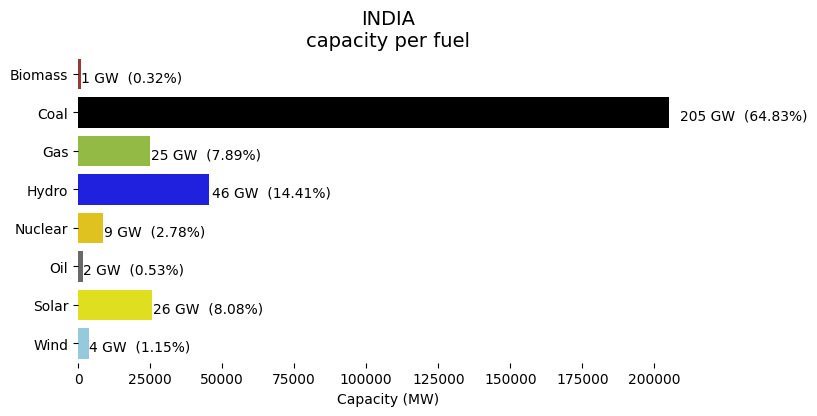

In [103]:
i = 'India'
PF = df[df['Country'] == i].groupby('Primary Fuel').sum().reset_index()  # FUEL
PF['percent'] = PF['Capacity (MW)']/PF['Capacity (MW)'].sum()

plt.figure(figsize=(8,4))
ax = sns.barplot(data = PF, x = 'Capacity (MW)', y = 'Primary Fuel', palette = fuel)
plt.title('{}\ncapacity per fuel'.format(i.upper()), fontsize = 14)
plt.ylabel("")
plt.legend([], frameon = False)
plt.box(False)

for p in ax.patches:
    x = p.get_width()
    cap_per = "{:,.0f} GW  ({:,.2f}%)".format(x/1000, x * 100/PF['Capacity (MW)'].sum())
    ax.annotate("{}".format(cap_per), (p.get_x() + p.get_width() * 1.02, p.get_y() + .5), ha='left', va='center')

plt.show()

_Inference_
1. India and China have a bulk of their power plants using Coal as the primary fuel
2. USA has Gas as their primary fuel source

# Conclusion
With the visuals created, we saw an interesting phenomenon where India generated more power than many countries despite having less number of power plants. I think its safe to say that the reason is the abundant number of coal power plants and it seems that coal power plants produce more power compared to power plants using other primary fuels

# Author
_Eshwanth_